In [458]:
import logging
logging.basicConfig(filename='example.log',level=logging.ERROR)

In [459]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import skimage.draw

# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

from samples.mol import mol

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Path to Ballon trained weights
# You can download this file from the Releases page
# https://github.com/matterport/Mask_RCNN/releases
MOL_WEIGHTS_PATH = "/home/zeng/Mask_RCNN/logs/mol20190315T1531/mask_rcnn_mol_0498.h5"  # TODO: update this path

In [460]:
config = mol.molConfig()
MOL_DIR = os.path.join(ROOT_DIR, "datasets/mol")

In [461]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

In [462]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    fig, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax, fig

In [463]:
# Load validation dataset
dataset = mol.molDataset()
dataset.load_mol(MOL_DIR, "val")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 31
Classes: ['BG', 'mol']


In [464]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)

In [465]:
# Set path to balloon weights file

# Download file from the Releases page and set its path
# https://github.com/matterport/Mask_RCNN/releases
weights_path = "/home/zeng/Mask_RCNN/logs/mol20190315T1531/mask_rcnn_mol_0498.h5"

# Or, load the last model you trained
#weights_path = model.find_last()

# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  /home/zeng/Mask_RCNN/logs/mol20190315T1531/mask_rcnn_mol_0498.h5
Re-starting from epoch 498


# Using


*** No instances to display *** 



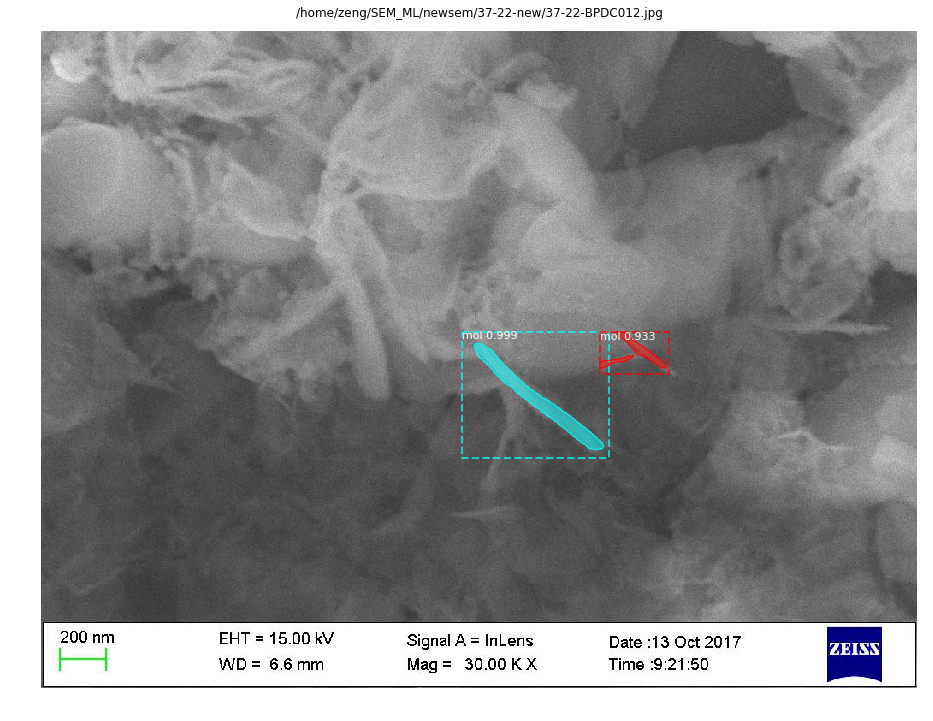

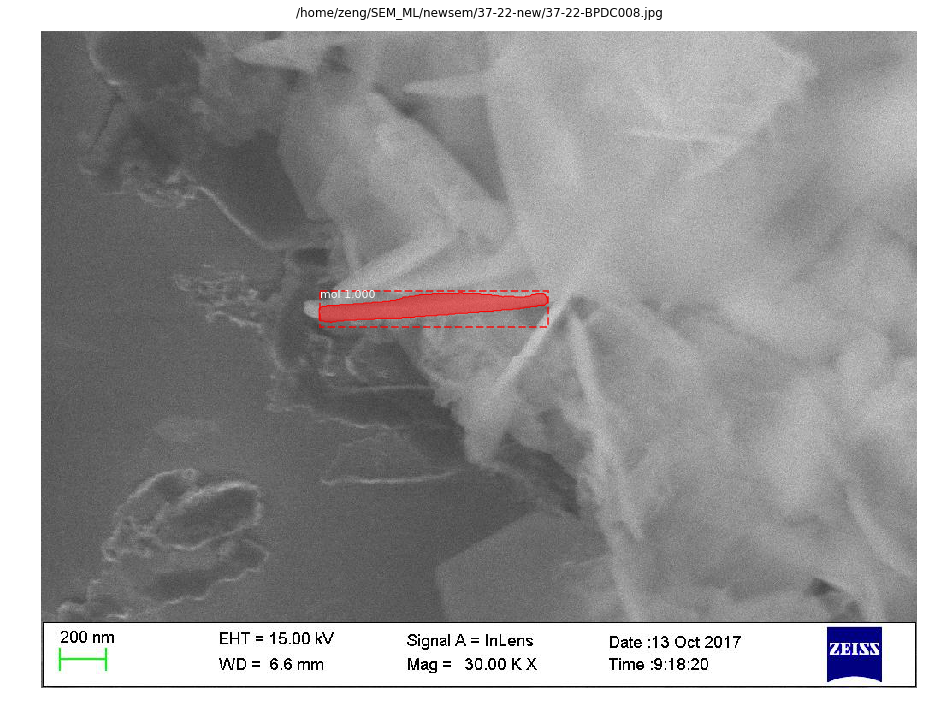

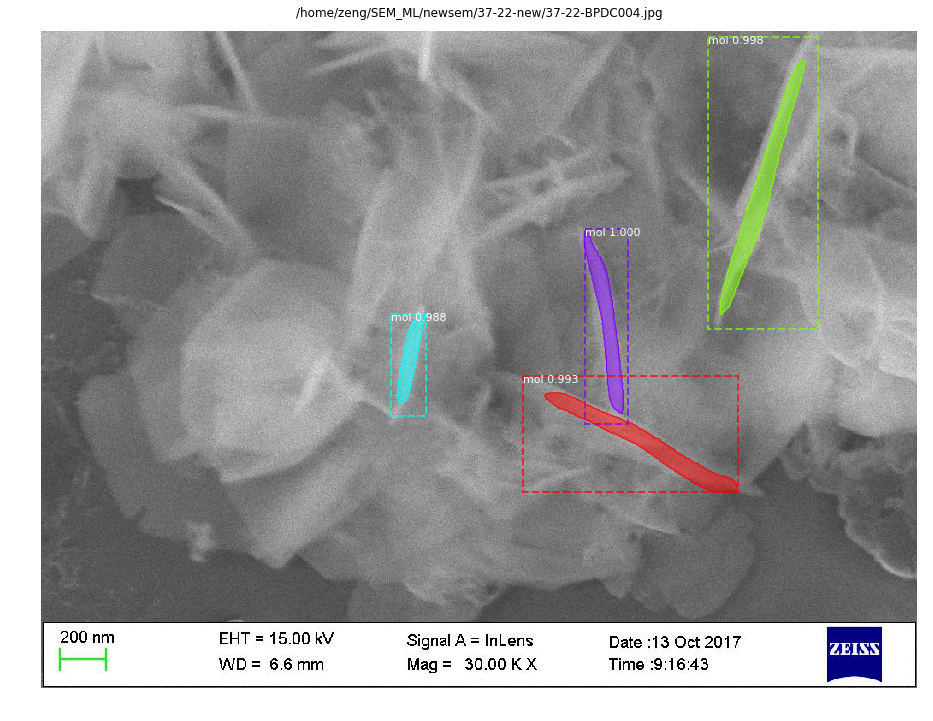

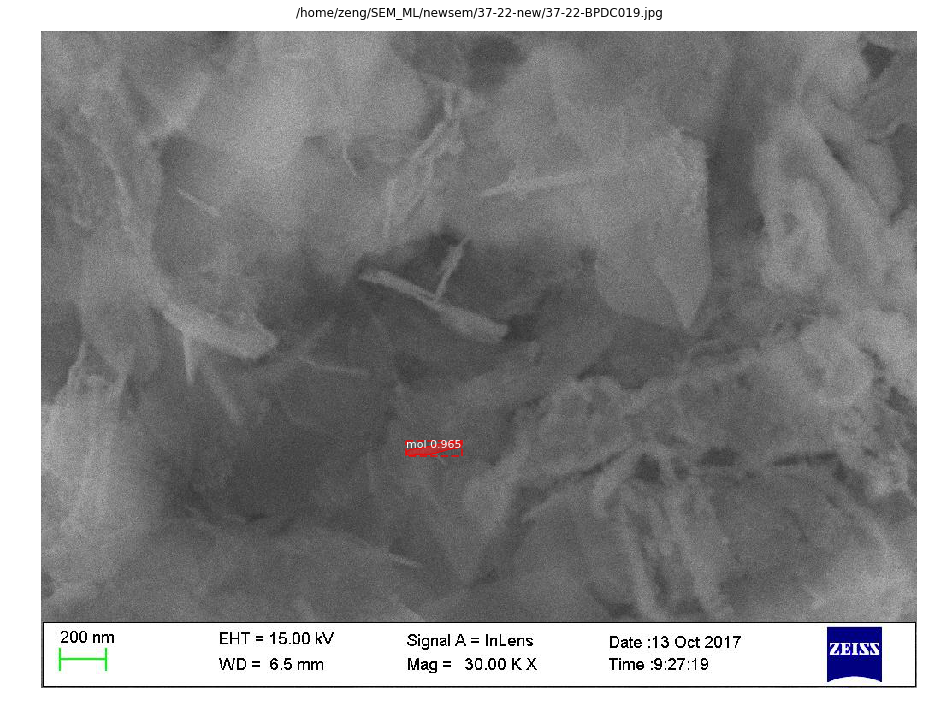

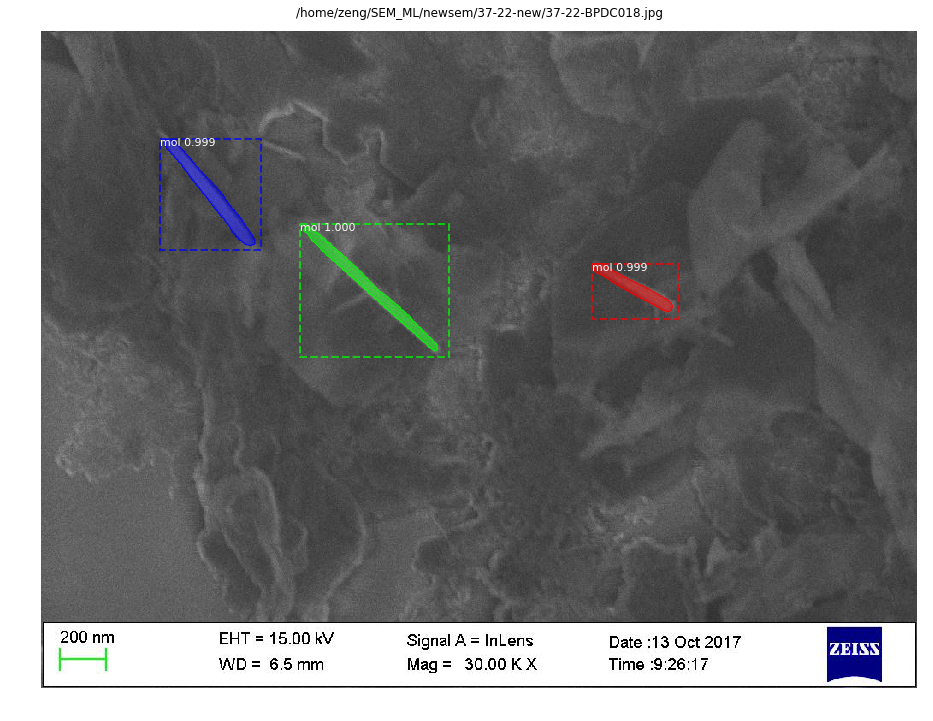

...

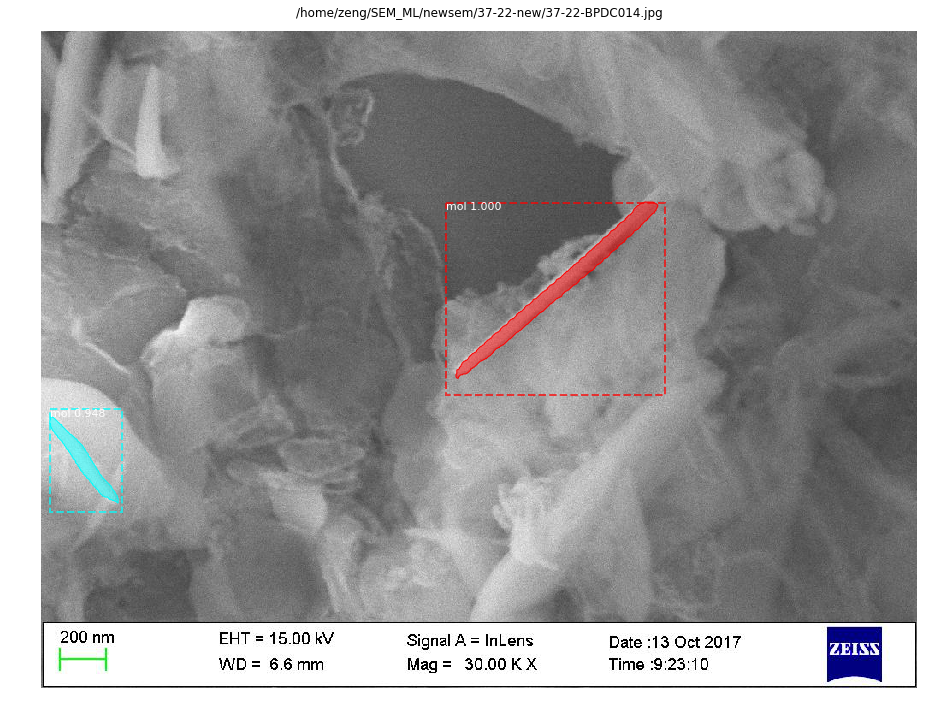

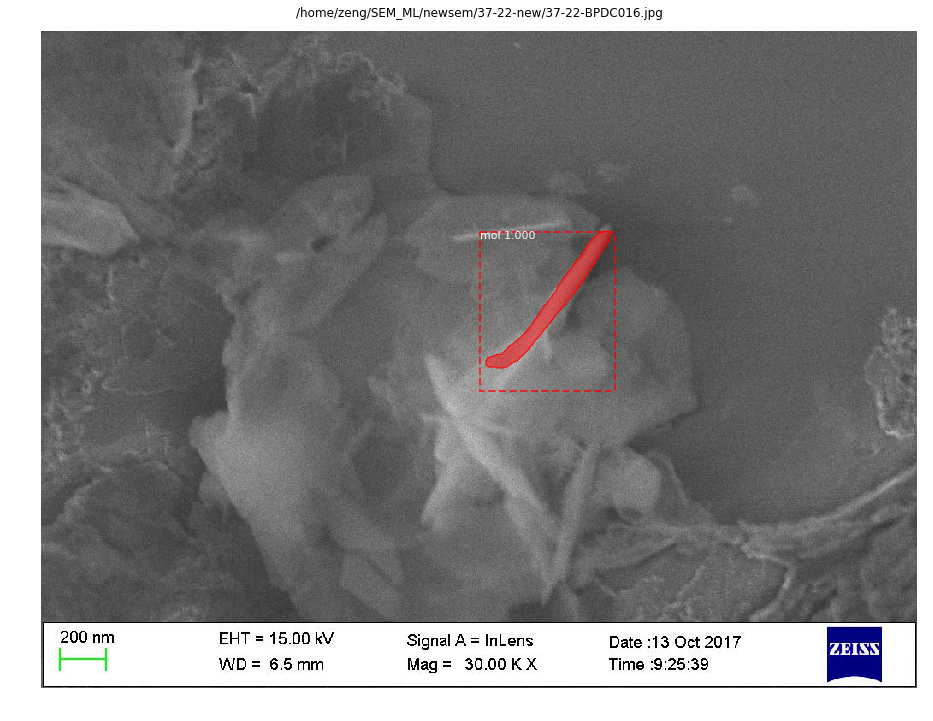

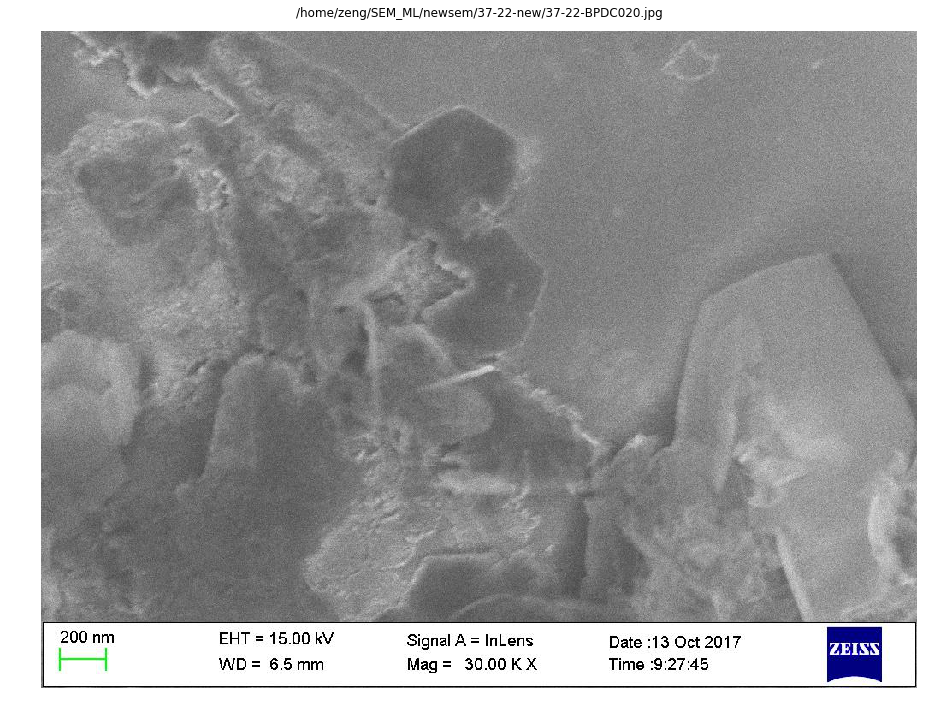

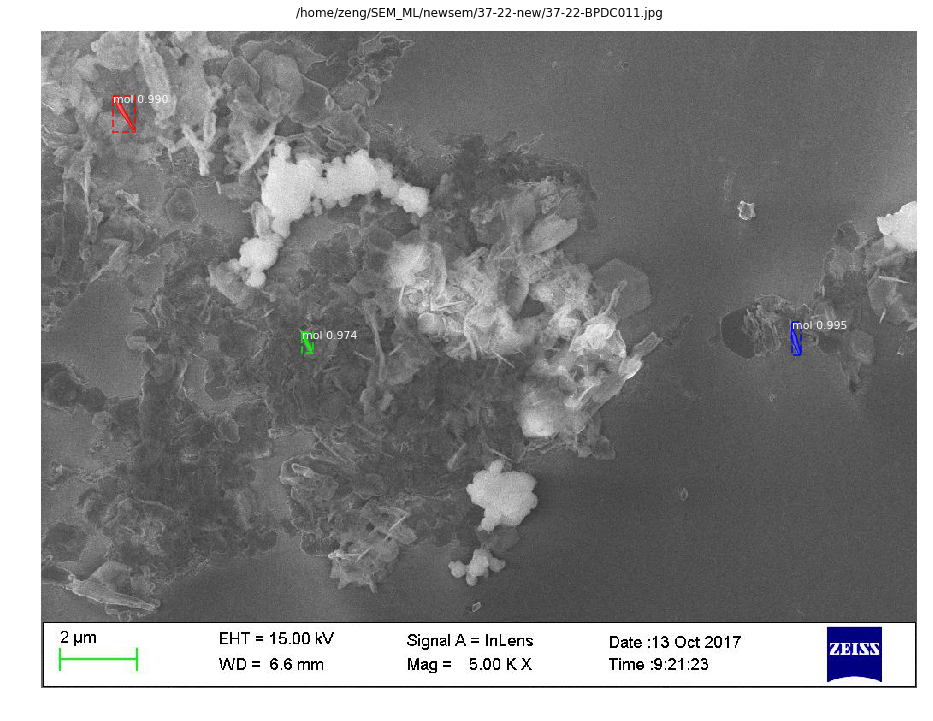

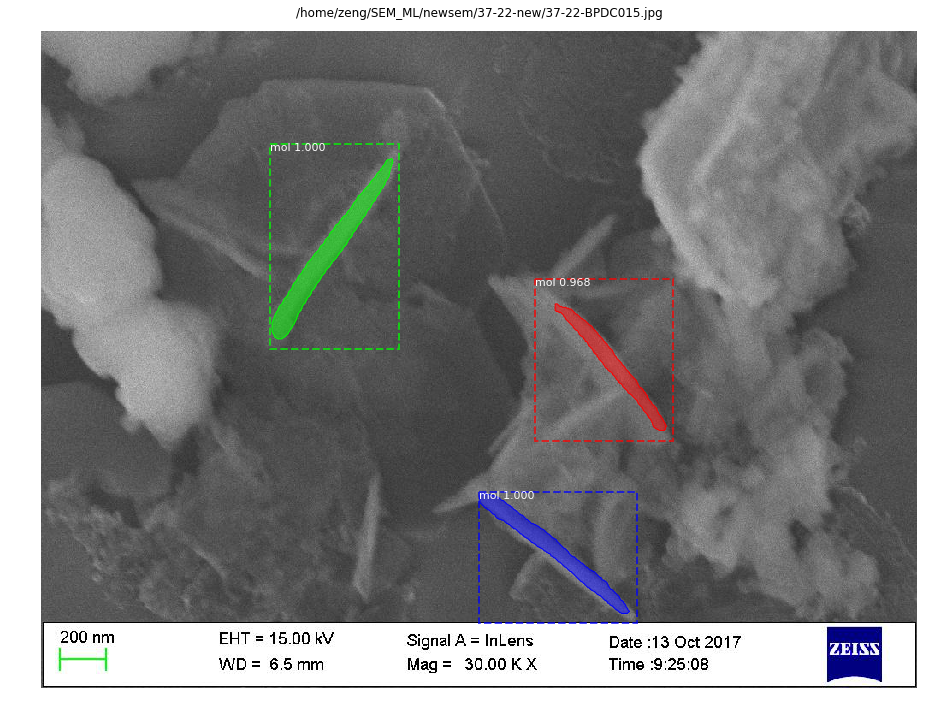

In [466]:
# path = '/home/zeng/Mask_RCNN/datasets/mol/val'
path = '/home/zeng/SEM_ML/newsem/37-22-new'
# path1 = '/home/zeng/SEM_ML/'

# for folder in os.listdir(path1):
#     path = os.path.join(path1, folder)
for fname in os.listdir(path):
    if fname[-3:] != 'jpg':
        continue
    image_path = os.path.join(path, fname)
    image = skimage.io.imread(image_path)
    results = model.detect([image], verbose=0)

    # Display results
    ax, fig = get_ax(1)
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                dataset.class_names, r['scores'], ax=ax,
                                title=image_path)

    # save result image and related output
    fig.savefig(image_path[:-4]+'_pred.png', bbox_inches='tight')
    np.savez(image_path[:-4]+'_pred', rois=r['rois'], 
             masks=r['masks'], class_ids=r['class_ids'], 
             scores=r['scores'])

### Evalutate Model by mAP

In [147]:
class InferenceConfig(mol.molConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

original_image           shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
image_meta               shape: (14,)                 min:    0.00000  max: 1024.00000  float64
gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (1, 4)                min:  449.00000  max:  632.00000  int32
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  bool
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
IoU= 0.25, AP=1.000000, precisions=[1.  1.  0.5 0. ], recalls=[0. 1. 1. 1.]
IoU=  0.5, AP=1.000000, precisions=[1.  1.  0.5 0. ],

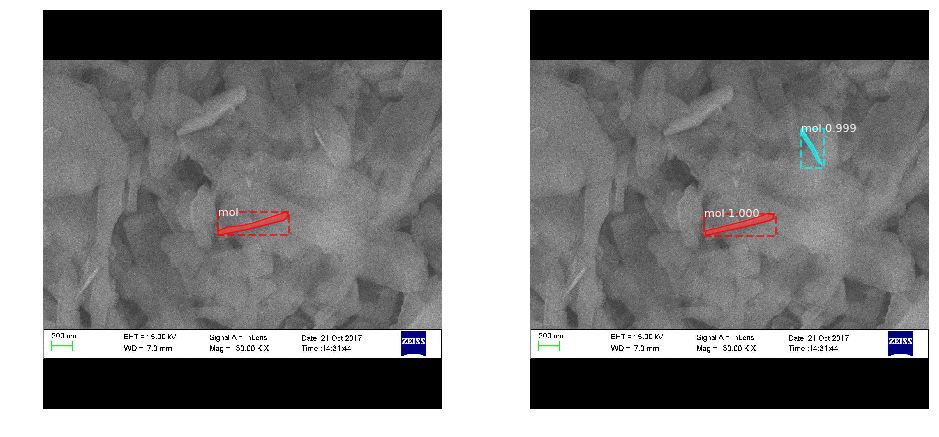

In [448]:
ax = get_ax(rows=1, cols=2, size=8)
# Test on a random image
image_id = random.choice(dataset.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, inference_config, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            ['BD', 'mol'], figsize=(8, 8), ax=ax[0][0])

results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            ['BD', 'mol'], r['scores'], figsize=(8, 8), ax=ax[0][1])

for iou_threshhold in [0.25, 0.5, 0.75, 0.9]:
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'], 
                         iou_threshold=iou_threshhold)
    print("IoU={:>5}, AP={:>5f}, precisions={}, recalls={}".format(iou_threshhold, 
                                                                   AP, 
                                                                   precisions, recalls))


In [149]:
# Compute VOC-Style mAP @ IoU=0.5
image_ids = dataset.image_ids
APs = {0.25: [], 0.3: [], 0.4: [], 0.5: [], 0.75: [], 0.8: []}
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, inference_config,
                               image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    for iou_threshhold in APs.keys():
        AP, precisions, recalls, overlaps =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                             r["rois"], r["class_ids"], r["scores"], r['masks'], iou_threshold=iou_threshhold)
        APs[iou_threshhold].append(AP)

In [150]:
for iou_threshhold, aps in APs.items():
    print("mAP (IoU={}): {}".format(iou_threshhold, np.mean(aps)))

mAP (IoU=0.25): 0.9272401448219053
mAP (IoU=0.3): 0.9272401448219053
mAP (IoU=0.4): 0.8949820803057763
mAP (IoU=0.5): 0.8573476720240808
mAP (IoU=0.75): 0.26362007319606756
mAP (IoU=0.8): 0.16397849566513492
